In [1]:
import pandas as pd
import numpy as np
from statsmodels.tsa.seasonal import seasonal_decompose
from matplotlib import pyplot as plt

In [2]:
data_dir = "D:\\DS_Data\\time_series\\"

In [3]:
train = pd.read_csv(data_dir + 'train.csv', low_memory=False)

In [4]:
train.sample(10)

,id,date,store_nbr,item_nbr,unit_sales,onpromotion
44895210,44895210,2015-04-16,7,671699,0.575,False
125393216,125393216,2017-08-14,54,567778,3.000,False
55875973,55875973,2015-09-06,27,401817,5.000,False
96311346,96311346,2016-11-08,29,979195,6.000,False
60548968,60548968,2015-10-29,1,1975571,1.000,False
73519009,73519009,2016-03-16,38,1047773,6.000,False
14738025,14738025,2013-11-30,16,358515,4.000,NaN
115817836,115817836,2017-05-16,19,1239862,2.529,False
120246803,120246803,2017-06-27,6,265672,3.000,True
75751224,75751224,2016-04-09,3,168989,3.000,False


In [5]:
len(train)

125497040

In [6]:
train.store_nbr.unique()

array([25,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 23, 24, 26, 27, 28, 30, 31, 32, 33, 34, 35, 37, 38, 39,
       40, 41, 43, 44, 45, 46, 47, 48, 49, 50, 51, 54, 36, 53, 20, 29, 21,
       42, 22, 52], dtype=int64)

In [7]:
# Помотрим размеры выборок по магазинам
for store in train.store_nbr.unique():
    df_temp = pd.DataFrame(train[train.store_nbr==store].groupby('date', as_index=False)['unit_sales'].sum())
    print('store {}, size {}'.format(store, len(df_temp)))

store 25, size 1618
store 1, size 1678
store 2, size 1679
store 3, size 1679
store 4, size 1679
store 5, size 1679
store 6, size 1679
store 7, size 1679
store 8, size 1679
store 9, size 1679
store 10, size 1679
store 11, size 1679
store 12, size 1619
store 13, size 1679
store 14, size 1641
store 15, size 1679
store 16, size 1679
store 17, size 1677
store 18, size 1569
store 19, size 1679
store 23, size 1679
store 24, size 1578
store 26, size 1679
store 27, size 1679
store 28, size 1679
store 30, size 1656
store 31, size 1679
store 32, size 1679
store 33, size 1679
store 34, size 1679
store 35, size 1679
store 37, size 1679
store 38, size 1679
store 39, size 1679
store 40, size 1679
store 41, size 1679
store 43, size 1675
store 44, size 1679
store 45, size 1679
store 46, size 1679
store 47, size 1679
store 48, size 1679
store 49, size 1679
store 50, size 1679
store 51, size 1679
store 54, size 1679
store 36, size 1553
store 53, size 1169
store 20, size 911
store 29, size 876
store 21, s

In [8]:
# Возьмем магазин №25 согласно заданию
data = train[train.store_nbr==25]
data = data.copy()

In [9]:
data.drop(['id','store_nbr'], axis=1, inplace=True)

In [10]:
data = pd.DataFrame(data.groupby('date', as_index=False)['unit_sales'].sum())

In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1618 entries, 0 to 1617
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   date        1618 non-null   object 
 1   unit_sales  1618 non-null   float64
dtypes: float64(1), object(1)
memory usage: 25.4+ KB


In [12]:
# приводим индексы к стандарту pd.Datetime, чтобы потом это можно было скормить seasonal_decompose
data = data.set_index(pd.DatetimeIndex(data['date']))
data.drop(['date'], axis=1, inplace=True)
data.head(10)

,unit_sales
date,
2013-01-01,2511.619
2013-01-02,5316.224
2013-01-03,4442.913
2013-01-04,4844.354
2013-01-05,5817.526
2013-01-06,3201.695
2013-01-07,2783.978
2013-01-08,2884.284
2013-01-09,3565.639


In [13]:
data = data.asfreq('D', method='ffill')
#data = data.asfreq('D').fillna(data.median())

In [14]:
data.head(20)

,unit_sales
date,
2013-01-01,2511.619
2013-01-02,5316.224
2013-01-03,4442.913
2013-01-04,4844.354
2013-01-05,5817.526
2013-01-06,3201.695
2013-01-07,2783.978
2013-01-08,2884.284
2013-01-09,3565.639


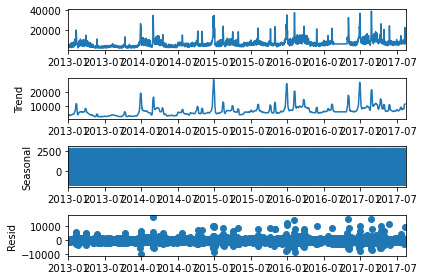

In [15]:
# применяем seasonal_decompose
# эта функция разложит ряд на трендовую, сезонную и шумовую составляющие
decomposition = seasonal_decompose(data, model='additive')
decomposition.plot()
plt.show() 

In [16]:
def plotseasonal(res, axes):
    res.observed.plot(ax=axes[0], legend=False)
    axes[0].set_ylabel('Observed')
    res.trend.plot(ax=axes[1], legend=False)
    axes[1].set_ylabel('Trend')
    res.seasonal.plot(ax=axes[2], legend=False)
    axes[2].set_ylabel('Seasonal')
    res.resid.plot(ax=axes[3], legend=False)
    axes[3].set_ylabel('Residual')

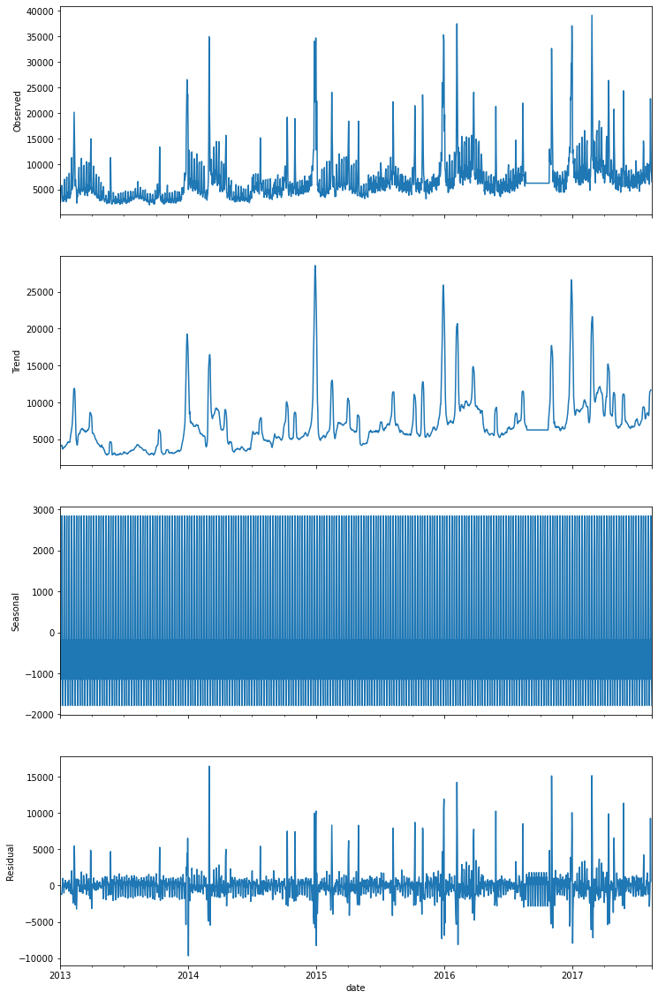

In [17]:
fig, axes = plt.subplots(ncols=1, nrows=4, sharex=True, figsize=(12,20))

plotseasonal(decomposition, axes)

In [18]:
trend_part = decomposition.trend # отдельно трендовая составляющаяя
seasonal_part = decomposition.seasonal # отдельно сезонная составляющаяя
residual_part = decomposition.resid # отдельно шум

## 1. Сколько элементов содержит исходный датасет?

- весь датасет - 125497040 записей
- продажи магазина №25, сгруппированные по дате - 1618 записей

## 2. Сколько элементов содержит шумовая часть?

In [19]:
len(residual_part)

1688

## 3. Сколько числовых элементов содержит шумовая часть?

In [20]:
len(residual_part.dropna())

1682

## 4. Сколько элементов содержит сезонная часть?

In [21]:
len(seasonal_part)

1688

## 5. Сколько числовых элементов содержит трендовая часть?

In [22]:
len(trend_part.dropna())

1682

## 6. Выполните тест Дики-Фуллера

In [23]:
from statsmodels.tsa.stattools import adfuller

test = adfuller(data['unit_sales'])
print ('adf: ', test[0] )
print ('p-value: ', test[1])
print ('Critical values: ', test[4])
if test[0]> test[4]['5%']: # проверка, больше ли критического полученное значение для нашего ряда 
    print ('ряд не стационарен')
else:
    print ('ряд стационарен')

adf:  -5.079730290043795
p-value:  1.539610002492867e-05
Critical values:  {'1%': -3.4342906911169404, '5%': -2.8632805908715726, '10%': -2.5676966486957706}
ряд стационарен


# Разобьем данные

In [24]:
from sklearn.model_selection import TimeSeriesSplit

tscv = TimeSeriesSplit(n_splits=3, test_size=5)
train_test_groups = tscv.split(data.unit_sales) 
for train_index, test_index in train_test_groups:
    print("TRAIN size:", len(train_index), "TEST size:", len(test_index))

TRAIN size: 1673 TEST size: 5
TRAIN size: 1678 TEST size: 5
TRAIN size: 1683 TEST size: 5


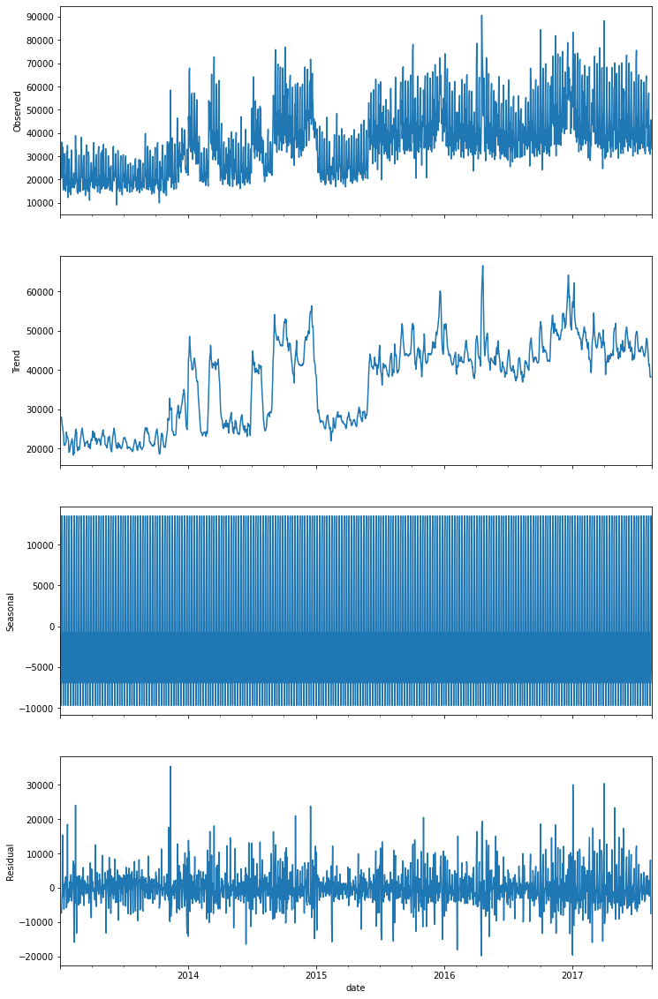

In [25]:
df_temp = pd.DataFrame(train[train.store_nbr==44].groupby('date', as_index=False)['unit_sales'].sum())
df_temp = df_temp.set_index(pd.DatetimeIndex(df_temp['date']))
df_temp.drop(['date'], axis=1, inplace=True)
df_temp = df_temp.asfreq('D', method='ffill')
decomposition = seasonal_decompose(df_temp, model='additive')
fig, axes = plt.subplots(ncols=1, nrows=4, sharex=True, figsize=(12,20))
plotseasonal(decomposition, axes)

# Выберите временной ряд для одного магазина 
# Постройте скользящее среднее c окном 5.

In [26]:
df_temp['rolling_mean'] = df_temp.unit_sales.rolling(window=5).mean()

In [27]:
df_temp.head(10)

,unit_sales,rolling_mean
date,,
2013-01-02,30095.181,NaN
2013-01-03,20447.057,NaN
2013-01-04,22795.799,NaN
2013-01-05,31382.508,NaN
2013-01-06,36069.345,28157.9780
2013-01-07,21025.329,26344.0076
2013-01-08,33993.257,29053.2476
2013-01-09,21296.042,28753.2962
2013-01-10,15522.828,25581.3602


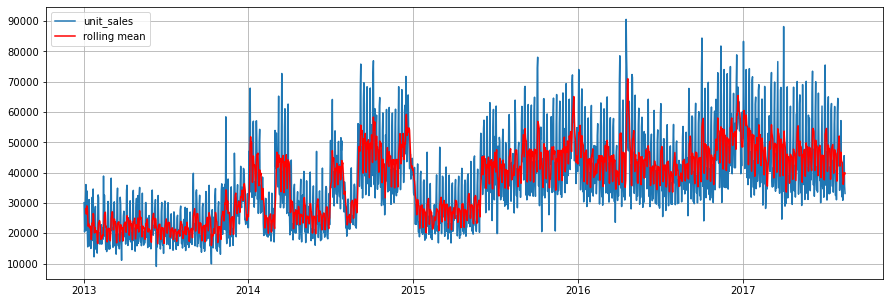

In [28]:
f, ax = plt.subplots(figsize=(15, 5))
ax.plot(df_temp.index, df_temp.unit_sales) ## исходные данные
ax.plot(df_temp.index, df_temp.rolling_mean, c='r') ## оконное среднее
ax.legend(['unit_sales', 'rolling mean'])
ax.grid()

# Постройте скользящее квадратическое отклонение c окном 5. 

In [29]:
df_temp['rolling_std'] = df_temp.unit_sales.rolling(window=5).std()

In [30]:
df_temp.head(10)

,unit_sales,rolling_mean,rolling_std
date,,,
2013-01-02,30095.181,NaN,NaN
2013-01-03,20447.057,NaN,NaN
2013-01-04,22795.799,NaN,NaN
2013-01-05,31382.508,NaN,NaN
2013-01-06,36069.345,28157.9780,6421.669240
2013-01-07,21025.329,26344.0076,6993.225767
2013-01-08,33993.257,29053.2476,6757.549660
2013-01-09,21296.042,28753.2962,7127.878913
2013-01-10,15522.828,25581.3602,8958.979787


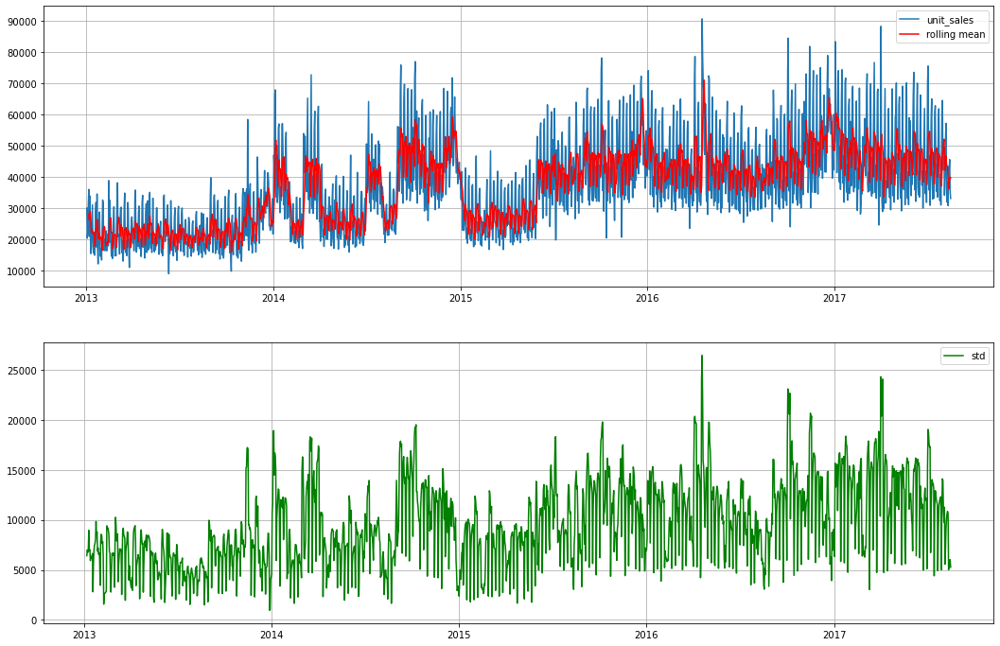

In [31]:
f, ax = plt.subplots(2, 1, figsize=(18, 12))
ax[0].plot(df_temp.index, df_temp.unit_sales) ## исходные данные
ax[0].plot(df_temp.index, df_temp.rolling_mean, c='r') ## оконное среднее
ax[0].legend(['unit_sales', 'rolling mean'])
ax[0].grid()

ax[1].plot(df_temp.index, df_temp.rolling_std, c='g') ## оконное стандартное отклонение
ax[1].grid()
ax[1].legend(['std'])
plt.show()

# Постройте линии Боллинджера с окном в 30

In [32]:
df_temp['boll_up'] = df_temp.unit_sales.rolling(window=30).mean() + 3*df_temp.unit_sales.rolling(window=30).std()
df_temp['boll_dn'] = df_temp.unit_sales.rolling(window=30).mean() - 3*df_temp.unit_sales.rolling(window=30).std()

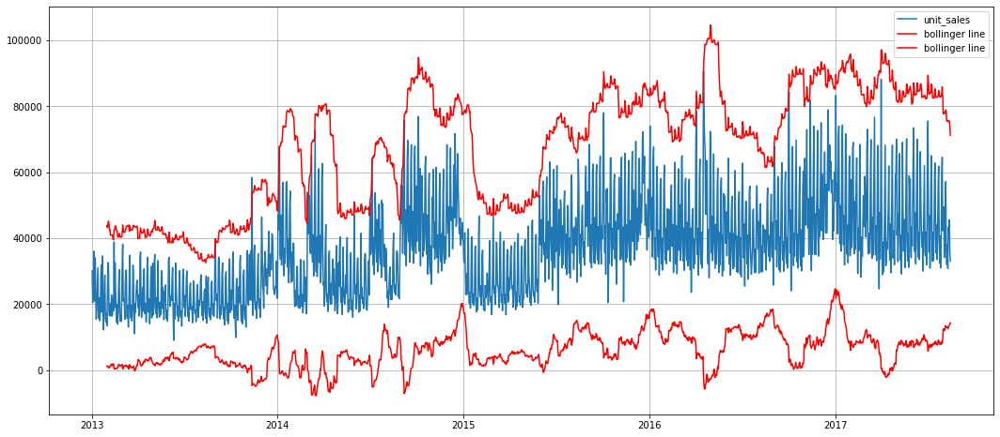

In [33]:
## визуализируем
f, ax = plt.subplots(1, 1, figsize=(18, 8))
ax.plot(df_temp.index, df_temp.unit_sales) ## исходные данные
ax.plot(df_temp.index, df_temp.boll_up,  c='r') ## верхняя линия Боллинджера
ax.plot(df_temp.index, df_temp.boll_dn,  c='r') ## нижняя линия Боллинджера
ax.legend(['unit_sales', 'bollinger line', 'bollinger line'])
ax.grid()

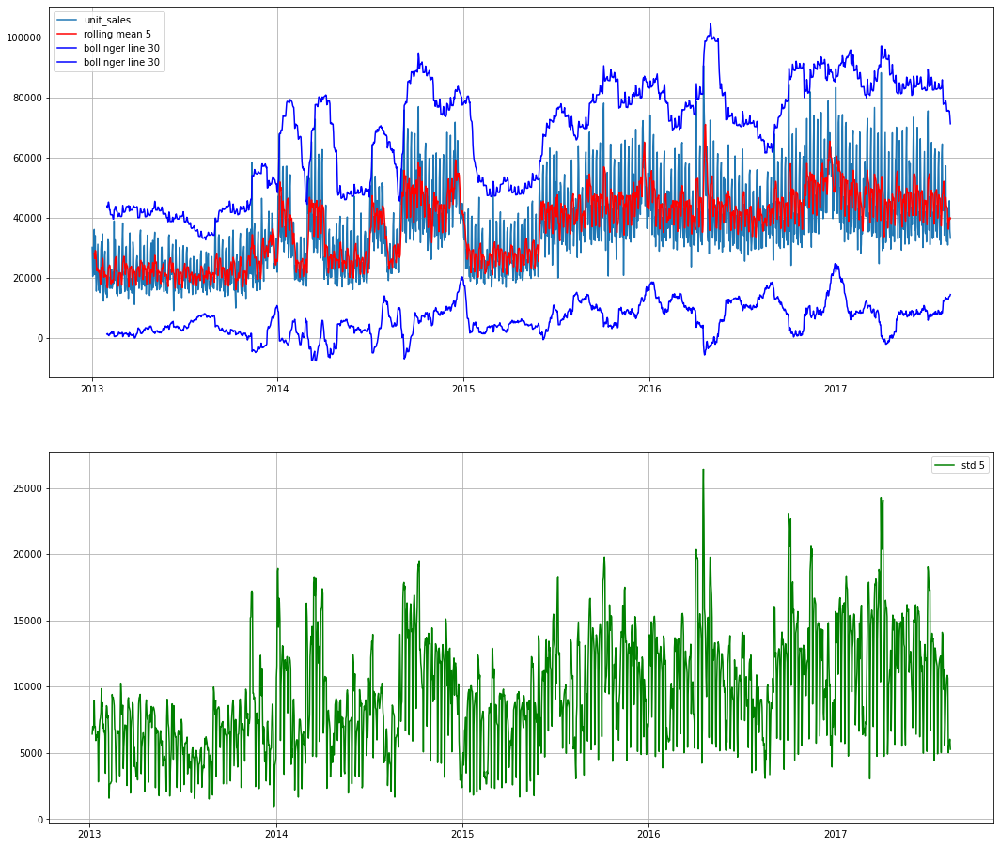

In [34]:
f, ax = plt.subplots(2, 1, figsize=(18, 16))
ax[0].plot(df_temp.index, df_temp.unit_sales) ## исходные данные
ax[0].plot(df_temp.index, df_temp.rolling_mean, c='r') ## оконное среднее
ax[0].plot(df_temp.index, df_temp.boll_up,  c='b') ## верхняя линия Боллинджера
ax[0].plot(df_temp.index, df_temp.boll_dn,  c='b') ## нижняя линия Боллинджера
ax[0].legend(['unit_sales', 'rolling mean 5', 'bollinger line 30', 'bollinger line 30'])
ax[0].grid()

ax[1].plot(df_temp.index, df_temp.rolling_std, c='g') ## оконное стандартное отклонение
ax[1].grid()
ax[1].legend(['std 5'])
plt.show()

# Постройте оконное среднее с окном в 10 точек, экспоненциально среднее с окном в 7 точек (span=7). Отобразите их на отдельном графике. 

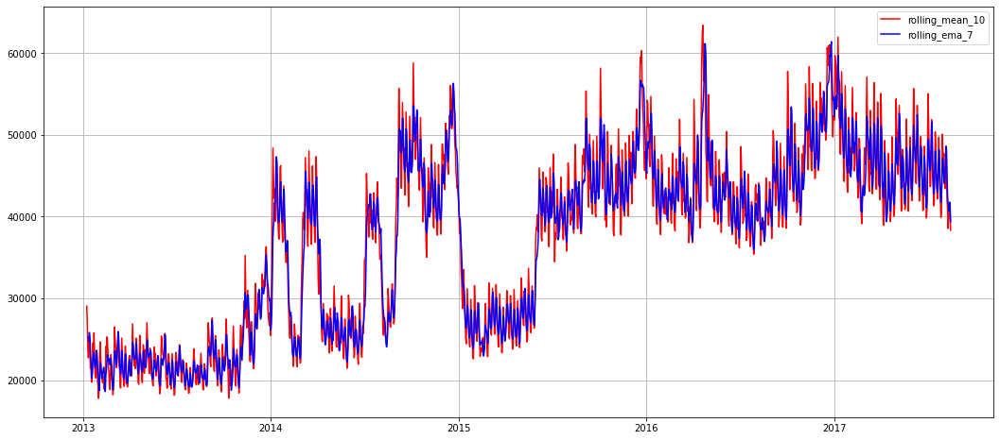

In [35]:
## делаем оконное среднее с окном в 10 точек
df_temp['rolling_mean_' + str(10)] = df_temp.unit_sales.rolling(window=10).mean()
## экспоненциально среднее с окном в N точек
df_temp['rolling_ema_' + str(7)] = df_temp.unit_sales.ewm(min_periods=7, span=7).mean()

## визуализируем
f, ax = plt.subplots(1, 1, figsize=(18, 8))
#ax.plot(df_temp.index, df_temp.unit_sales) ## исходные данные
ax.plot(df_temp.index, df_temp['rolling_ema_' + str(7)],  c='r') ## ema
ax.plot(df_temp.index, df_temp['rolling_mean_' + str(10)],  c='b') ## скользящее среднее

ax.legend(['rolling_mean_' + str(10), 'rolling_ema_' + str(7)])
ax.grid()

# Напишите свою скользящую функцию, которая будет являться средним арифметическим между максимальным и минимальным значением unit_sales, используя окно 10.

In [36]:
def roll_func(value):
    return (max(value)+min(value))/2

In [37]:
df_temp['roll_func'] = df_temp.unit_sales.rolling(window=10).apply(roll_func, raw=False)

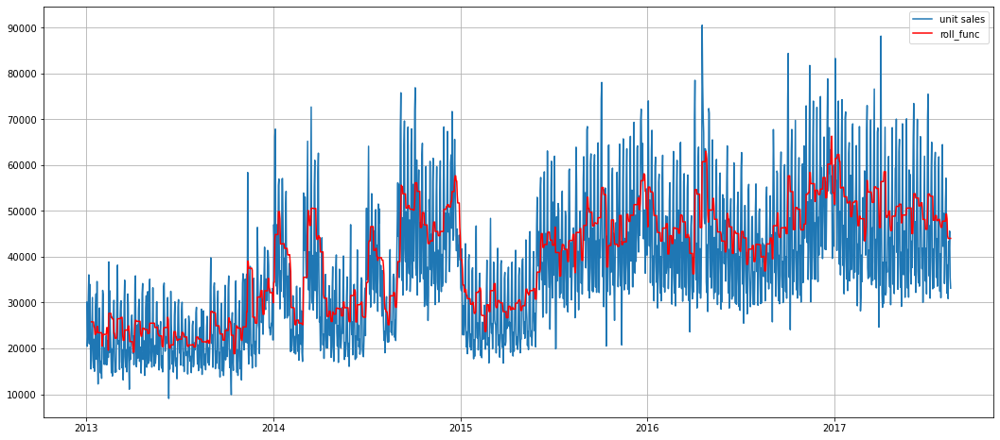

In [38]:
## визуализируем
f, ax = plt.subplots(1, 1, figsize=(18, 8))
ax.plot(df_temp.index, df_temp.unit_sales) ## исходные данные
ax.plot(df_temp.index, df_temp.roll_func,  c='r')
ax.legend(['unit sales', 'roll_func'])
ax.grid()

# Постройте скользящее среднее с окном 50 и экспоненциальное скользящее среднее с окном 10 (span=10). 

In [39]:
## делаем оконное среднее с окном в 50 точек
df_temp['rolling_mean_' + str(50)] = df_temp.unit_sales.rolling(window=50).mean()
## экспоненциально среднее с окном в N точек
df_temp['rolling_ema_' + str(10)] = df_temp.unit_sales.ewm(min_periods=10, span=10).mean()

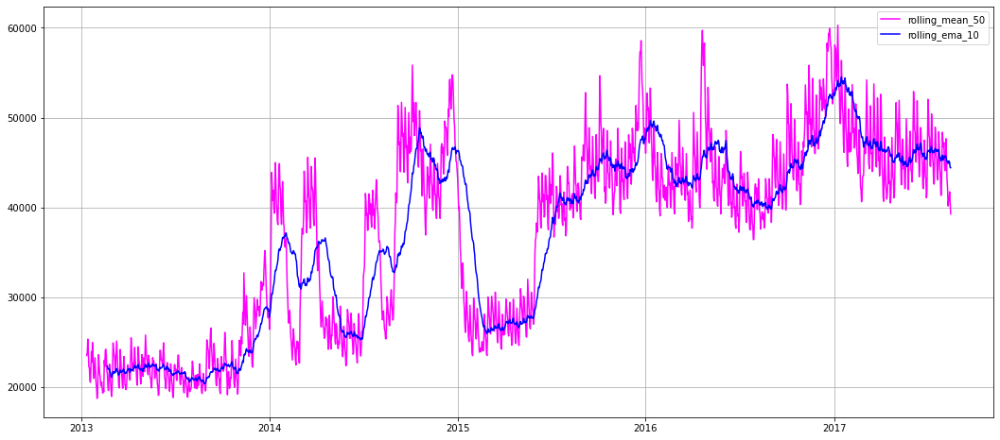

In [40]:
## визуализируем
f, ax = plt.subplots(1, 1, figsize=(18, 8))
#ax.plot(df_temp.index, df_temp.unit_sales) ## исходные данные
ax.plot(df_temp.index, df_temp['rolling_ema_' + str(10)],  c='magenta') ## ema
ax.plot(df_temp.index, df_temp['rolling_mean_' + str(50)],  c='b') ## скользящее среднее

ax.legend(['rolling_mean_' + str(50), 'rolling_ema_' + str(10)])
ax.grid()

# Укажите индексы датафрейма, на которых одно скользящее пересекается с другим.

In [41]:
df_temp['crossover']=np.sign((df_temp['rolling_mean_' + str(50)]-df_temp['rolling_ema_' + str(10)])).diff()

In [42]:
df_temp['crossover'].value_counts()

 0.0    1333
-2.0     152
 2.0     152
Name: crossover, dtype: int64

In [43]:
df_temp.index[df_temp['crossover']!=0]

DatetimeIndex(['2013-01-02', '2013-01-03', '2013-01-04', '2013-01-05',
               '2013-01-06', '2013-01-07', '2013-01-08', '2013-01-09',
               '2013-01-10', '2013-01-11',
               ...
               '2017-07-08', '2017-07-11', '2017-07-16', '2017-07-18',
               '2017-07-23', '2017-07-25', '2017-07-30', '2017-08-03',
               '2017-08-06', '2017-08-08'],
              dtype='datetime64[ns]', name='date', length=354, freq=None)

In [44]:
# Проверим количество точек пересечений
len(df_temp.index[df_temp['crossover']!=0])

354

# Получите лаговые факторы с 7-го по 10-й предыдущих дня (лаг7, лаг8, лаг9, лаг10) и отобразите на графике. 

C:\Users\maxsv\anaconda3\lib\site-packages\ipykernel_launcher.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  


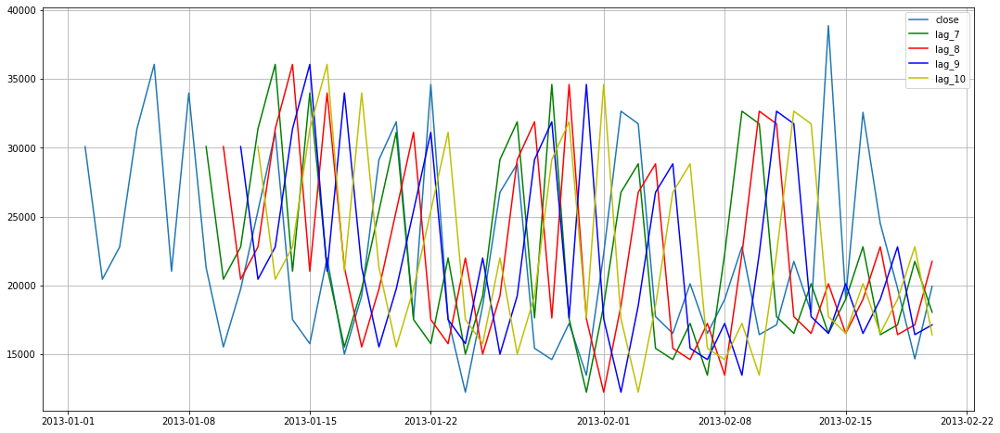

In [45]:
for i in range(7,111):
    df_temp['lag_{}'.format(i)] = df_temp.unit_sales.shift(i)

## визуализируем
f, ax = plt.subplots(1, 1, figsize=(18, 8))
ax.plot(df_temp.index[:50], df_temp.unit_sales[:50]) ## исходные данные
ax.plot(df_temp.index[:50], df_temp['lag_' + str(7)][:50],  c='g') 
ax.plot(df_temp.index[:50], df_temp['lag_' + str(8)][:50],  c='r') 
ax.plot(df_temp.index[:50], df_temp['lag_' + str(9)][:50],  c='b') 
ax.plot(df_temp.index[:50], df_temp['lag_' + str(10)][:50],  c='y') 
ax.legend(['close', 'lag_7', 'lag_8', 'lag_9', 'lag_10'])
ax.grid()

# ARMA-ARIMA

## Выберите продукт с номером 103501 (item_nbr) и приведите данные к виду временного ряда с группировкой по дате и агрегацией .sum()['unit_sales']

In [46]:
tmp = train[train.item_nbr == 103501].copy()
tmp['date'] = pd.to_datetime(tmp['date'])
tmp['year'] = tmp['date'].dt.year
unit_sales_by_date = tmp.groupby('date').sum()['unit_sales']

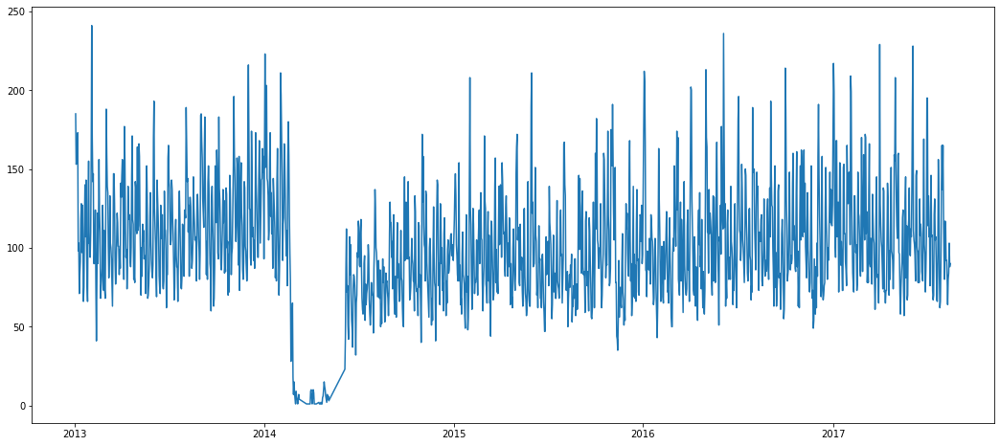

In [47]:
f, ax = plt.subplots(figsize=(18, 8))
ax.plot(unit_sales_by_date.index, unit_sales_by_date.values)

## Проведите тест Адфуллера. Стационарен ли ряд?

In [48]:
from statsmodels.tsa.stattools import adfuller

X = unit_sales_by_date.values
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

if result[0] < result[4]["5%"]:
    print ("Reject Ho - Time Series is Stationary")
else:
    print ("Failed to Reject Ho - Time Series is Non-Stationary")

ADF Statistic: -4.154403
p-value: 0.000786
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
Reject Ho - Time Series is Stationary


### ряд стационарен

## Постройте прогноз методом скользящего среднего с окном 6. Посчитайте метрики MSE, MAE, MAPE.

In [49]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error

(1619,) (1625,)
mean_squared_error 1139.483889232036
mean_absolute_error 26.661828289067326
mean_absolute_percentage_error 0.326732641949257


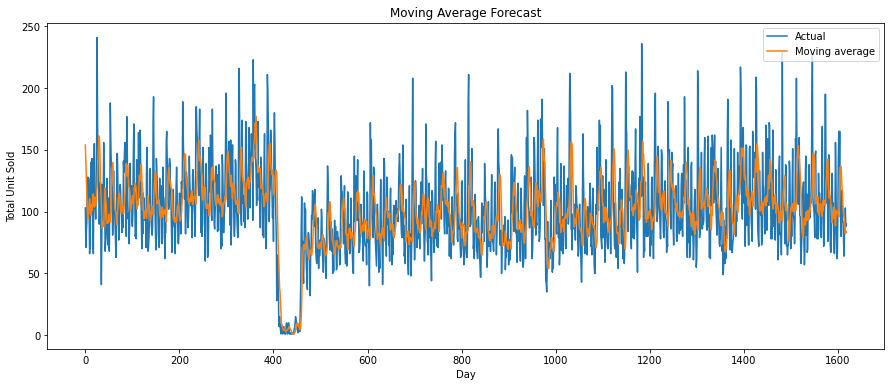

In [50]:
def moving_average_forecast(series, window_size):
    forecast = []
    for time in range(len(series) - window_size):
        forecast.append(series[time:time + window_size].mean())
    return np.array(forecast)
moving_average_days = 6
moving_avg = moving_average_forecast(unit_sales_by_date,moving_average_days )

print(moving_avg.shape,unit_sales_by_date.shape)

print("mean_squared_error",mean_squared_error(unit_sales_by_date.values[moving_average_days:], moving_avg))
print("mean_absolute_error",mean_absolute_error(unit_sales_by_date.values[moving_average_days:], moving_avg))
print("mean_absolute_percentage_error",mean_absolute_percentage_error(unit_sales_by_date.values[moving_average_days:], moving_avg))


plt.figure(figsize=(15,6))

plt.plot(unit_sales_by_date.values[moving_average_days:], label="Actual")
plt.plot(moving_avg, label="Moving average")
plt.ylabel("Total Unit Sold")
plt.xlabel("Day")
plt.title("Moving Average Forecast")
plt.legend(loc="upper right")

## Сделайте лаги с 1 по 6. 

In [51]:
df = pd.DataFrame()

df["Original Values"]  = unit_sales_by_date
df["shift1"] = df["Original Values"].shift()
df["shift2"] = df["shift1"].shift()
df["shift3"] = df["shift2"].shift()
df["shift4"] = df["shift3"].shift()
df["shift5"] = df["shift4"].shift()
df["shift6"] = df["shift5"].shift()

## Разделите выборку на тренировочную и тестовую таким образом, чтобы в тест попадал весь 2017 год. 

In [52]:
lag_value = 6
df.dropna(inplace=True)


x_train, y_train = df['2013':'2016'].iloc[:,0:lag_value].values, df['2013':'2016'].iloc[:,lag_value:].values
x_test, y_test = df['2017'].iloc[:,0:lag_value].values, df['2017'].iloc[:,lag_value:].values

C:\Users\maxsv\anaconda3\lib\site-packages\ipykernel_launcher.py:6: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.
  


## Сделайте прогноз линейной регрессией, посчитайте значения метрик MSE, MAE, MAPE. 

[[ 0.31483972 -0.06093726 -0.00835441 -0.02690103 -0.05841532  0.65215135]]
[18.74834312]
mean_squared_error 913.1612631365098
mean_absolute_error 23.42463283045062
mean_absolute_percentage_error 0.21190002900141588


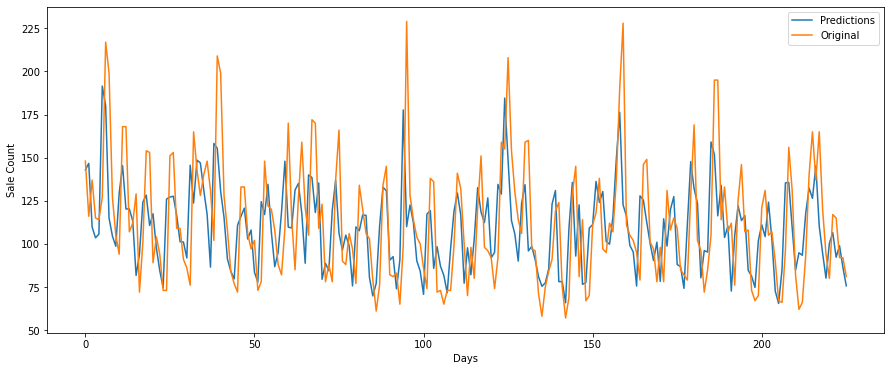

In [53]:
from sklearn.linear_model import LinearRegression
reg = LinearRegression().fit(x_train, y_train)
print(reg.coef_)
print(reg.intercept_)


ar_predictions = reg.predict(x_test)

plt.figure(figsize=(15,6))
plt.plot(ar_predictions ,label = "Predictions")
plt.plot(y_test, label = "Original" )
plt.xlabel("Days")
plt.ylabel("Sale Count")

print("mean_squared_error",mean_squared_error(y_test, ar_predictions))
print("mean_absolute_error",mean_absolute_error(y_test, ar_predictions))
print("mean_absolute_percentage_error",mean_absolute_percentage_error(y_test, ar_predictions))


plt.legend(loc="upper right")

## Определите p и q

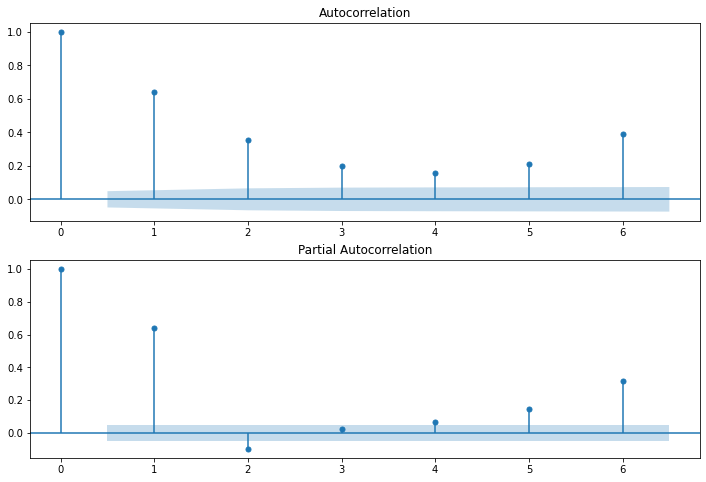

In [54]:
import statsmodels.api as sm
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(unit_sales_by_date.values.squeeze(), lags=6, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(unit_sales_by_date, lags=6, ax=ax2)

In [55]:
q=6
p=6
d=0

In [56]:
lag_value

6

## Постройте модели ARMA и ARIMA, сравните метрики. 

C:\Users\maxsv\anaconda3\lib\site-packages\ipykernel_launcher.py:7: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.
  import sys
C:\Users\maxsv\anaconda3\lib\site-packages\statsmodels\tsa\arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 

mean_squared_error 3255.8079700365347
mean_absolute_error 47.09761983026505
mean_absolute_percentage_error 0.46886846446150837


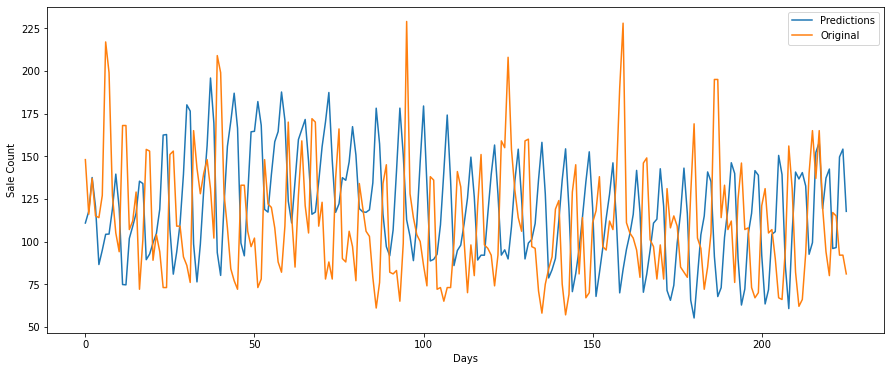

In [57]:
### ARMA
import statsmodels.api as sm
from statsmodels.tsa.arima_model import ARMA
from datetime import datetime, timedelta

x_train, y_train = df['2013':'2016'].iloc[:,0:lag_value], df['2013':'2016'].iloc[:,lag_value:]
x_test, y_test = df['2017'].iloc[:,0:lag_value], df['2017'].iloc[:,lag_value:]

ARMA_model = ARMA(x_train.values.reshape(-1).tolist(), (p,q)).fit()
arma_predictions = ARMA_model.predict(start=len(x_train), end=len(x_train) + len(x_test)-1, dynamic=False)


plt.figure(figsize=(15,6))
plt.plot(arma_predictions ,label = "Predictions")
plt.plot(y_test.values, label = "Original" )
plt.xlabel("Days")
plt.ylabel("Sale Count")
plt.legend(loc="upper right")

print("mean_squared_error",mean_squared_error(y_test, arma_predictions))
print("mean_absolute_error",mean_absolute_error(y_test, arma_predictions))
print("mean_absolute_percentage_error",mean_absolute_percentage_error(y_test, arma_predictions))

In [58]:
### ARIMA
from statsmodels.tsa.arima_model import ARIMA

model = ARIMA(x_train['Original Values'].values, (p,d,q)).fit()

C:\Users\maxsv\anaconda3\lib\site-packages\statsmodels\tsa\arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)

  warnings.warn(ARIMA_DEPRECATION_WARN, FutureWarning)


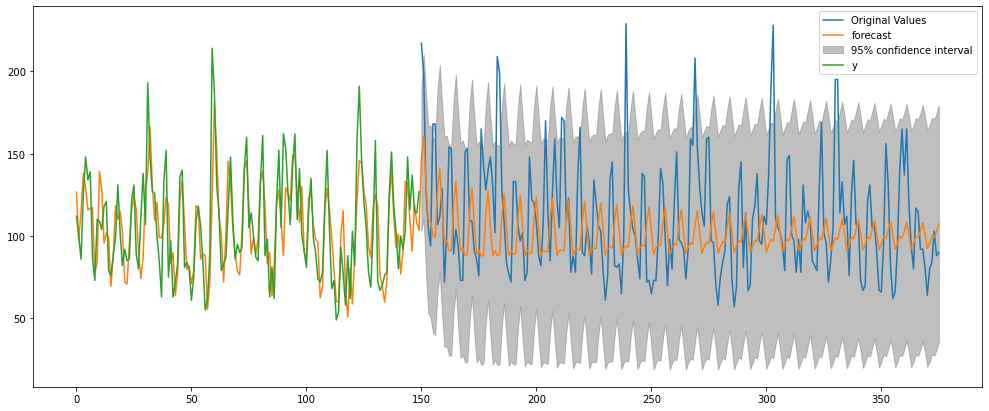

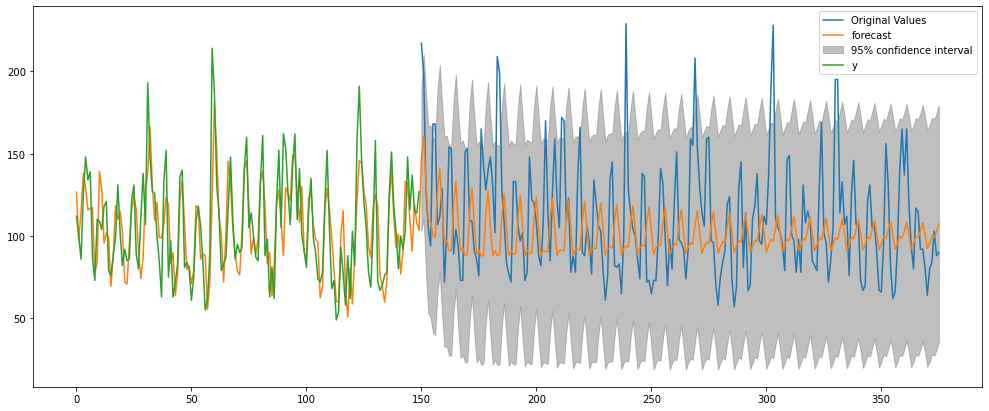

In [59]:
fig, ax = plt.subplots(figsize=(17,7))
shown_train_size = 150
train_size = len(x_train['Original Values'].values)
test_size = len(x_test['Original Values'].values) 
ax = x_test.set_index(pd.Series(range(shown_train_size, shown_train_size + test_size)))['Original Values'].plot(ax=ax)
model.plot_predict(start=train_size-shown_train_size,end=train_size+test_size -1,dynamic=False, plot_insample=True,ax=ax)

In [60]:
arima_predictions = model.predict(train_size, train_size + test_size -1)
print("mean_squared_error",mean_squared_error(y_test, arima_predictions))
print("mean_absolute_error",mean_absolute_error(y_test, arima_predictions))
print("mean_absolute_percentage_error",mean_absolute_percentage_error(y_test, arima_predictions))


mean_squared_error 1538.3405131551415
mean_absolute_error 29.59991829562807
mean_absolute_percentage_error 0.25492448706497517


## Сделайте вывод

Модель ARIMA показала лучшие метрики.

# FBProphet

In [61]:
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode()

from fbprophet import Prophet

### Приведите данные train.csv к виду временного ряда, сгруппированного по дате, с агрегирующей функцией sum() для столбца unit_sales.

In [62]:
transactions = train.groupby('date')['unit_sales'].sum()
py.iplot([go.Scatter(
    x=transactions.index,
    y=transactions
)])

In [63]:
transactions = pd.DataFrame(transactions).reset_index()
transactions.columns = ['ds', 'y']
transactions.head(5)

,ds,y
0,2013-01-01,2511.619
1,2013-01-02,496092.418
2,2013-01-03,361429.231
3,2013-01-04,354459.677
4,2013-01-05,477350.121


### Попробуйте выполнить предсказание пророком (prophet) на год вперёд (periods=365). Отобразите на графике. Посчитайте RSME.

In [64]:
m = Prophet()
m.fit(transactions)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [65]:
py.iplot([
    go.Scatter(x=transactions['ds'], y=transactions['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

In [66]:
# Вычислим среднеквадратичную ошибку. 1683 - количество исходных данных до 15.08.17 включительно
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1683, 'yhat']-transactions['y'])**2)) )

RMSE: 107831.725704


### Поэкспериментируйте с коэффициентом changepoint_prior_scale (переберите 3-5 значений, больше/меньше 0,5) и посмотрите, как изменится тренд. В какую сторону необходимо двигать коэффициент? Тренд переобучен или недообучен?

In [67]:
trends = pd.DataFrame()
scales = [0.05, 0.1, 1.5, 2.5, 3.5]
for scale in scales:
    m = Prophet(changepoint_prior_scale=scale)
    m.fit(transactions)
    future = m.make_future_dataframe(periods=365)
    forecast = m.predict(future)
    trends['scale' + str(scale)] = forecast['trend']

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [68]:
trends

,scale0.05,scale0.1,scale1.5,scale2.5,scale3.5
0,332114.062111,3.418227e+05,3.117181e+05,3.033305e+05,3.018468e+05
1,332493.518831,3.421058e+05,3.122661e+05,3.041197e+05,3.026822e+05
2,332872.975551,3.423888e+05,3.128141e+05,3.049089e+05,3.035177e+05
3,333252.432271,3.426719e+05,3.133620e+05,3.056982e+05,3.043531e+05
4,333631.888990,3.429550e+05,3.139100e+05,3.064874e+05,3.051886e+05
...,...,...,...,...,...
2044,996967.858867,1.019465e+06,1.009626e+06,1.015625e+06,1.014596e+06
2045,997243.261313,1.019786e+06,1.009934e+06,1.015944e+06,1.014913e+06
2046,997518.663759,1.020107e+06,1.010241e+06,1.016263e+06,1.015229e+06
2047,997794.066205,1.020428e+06,1.010549e+06,1.016581e+06,1.015546e+06


In [69]:
py.iplot([
    go.Scatter(x=transactions['ds'], y=transactions['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=trends['scale0.05'], name='trend scale 0.05'),
    go.Scatter(x=forecast['ds'], y=trends['scale0.1'], name='trend scale 0.1'),
    go.Scatter(x=forecast['ds'], y=trends['scale1.5'], name='trend scale 1.5'),
    go.Scatter(x=forecast['ds'], y=trends['scale2.5'], name='trend scale 2.5'),
    go.Scatter(x=forecast['ds'], y=trends['scale3.5'], name='trend scale 3.5')
])

### ВЫВОД. changepoint_prior_scale 0.1 лучше всего передает тенденцию, меньшие значения - недообучение, значения больше 1 дают переобучение

### Отобразите результаты с подобранным коэффициентом на графике. Как изменилась ошибка?

In [70]:
m = Prophet(changepoint_prior_scale=0.1)
m.fit(transactions)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [71]:
py.iplot([
    go.Scatter(x=transactions['ds'], y=transactions['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

In [72]:
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1683, 'yhat']-transactions['y'])**2)) )

RMSE: 104594.313136


### Ошибка уменьшилась

### Добавьте в модель месячную сезонность (name='monthly', period=30.5, fourier_order=5). Как изменилась ошибка? Улучшилась ли модель? Отобразите на графике. Посчитайте ошибку.

In [73]:
m = Prophet(changepoint_prior_scale=0.1)
m.add_seasonality(name='monthly', period=30.5, fourier_order=5)
m.fit(transactions)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [74]:
# Вычислим среднеквадратичную ошибку.
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-transactions['y'])**2)) )
py.iplot([
    go.Scatter(x=transactions['ds'], y=transactions['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

RMSE: 97118.588821


### Ошибка уменьшилась

### Улучшите модель добавлением данных о праздниках. Отобразите результат, сделайте письменный вывод.

In [75]:
df_holidays_events = pd.read_csv(data_dir + 'holidays_events.csv')

In [76]:
holidays = df_holidays_events[df_holidays_events['transferred'] == False][['description', 'date']]
holidays.columns = ['holiday', 'ds']
#holidays['lower_window'] = 0
#holidays['upper_window'] = 0
holidays

,holiday,ds
0,Fundacion de Manta,2012-03-02
1,Provincializacion de Cotopaxi,2012-04-01
2,Fundacion de Cuenca,2012-04-12
3,Cantonizacion de Libertad,2012-04-14
4,Cantonizacion de Riobamba,2012-04-21
...,...,...
345,Navidad-3,2017-12-22
346,Navidad-2,2017-12-23
347,Navidad-1,2017-12-24
348,Navidad,2017-12-25


In [77]:
m = Prophet(changepoint_prior_scale=0.1, holidays=holidays)
m.add_seasonality(name='monthly', period=30.5, fourier_order=5)
m.fit(transactions)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [78]:
# Вычислим среднеквадратичную ошибку.
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-transactions['y'])**2)) )
py.iplot([
    go.Scatter(x=transactions['ds'], y=transactions['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

RMSE: 79096.257939


### Вывод.
Настройка параметра changepoint_prior_scale, добавление сезонности внутри месяца и списка праздников позволило снизить значение среднеквадратичной ошибки со 107832 до 79096, на 26,6%

# XGBoost & CatBoost

In [79]:
import xgboost as xgb
from xgboost import plot_importance, plot_tree
from catboost import CatBoostRegressor

In [80]:
trans = transactions.copy()

In [81]:
trans.index = trans.ds.apply(lambda x: datetime.strptime(x,'%Y-%m-%d'))

In [82]:
trans.drop(['ds'], axis=1, inplace=True)

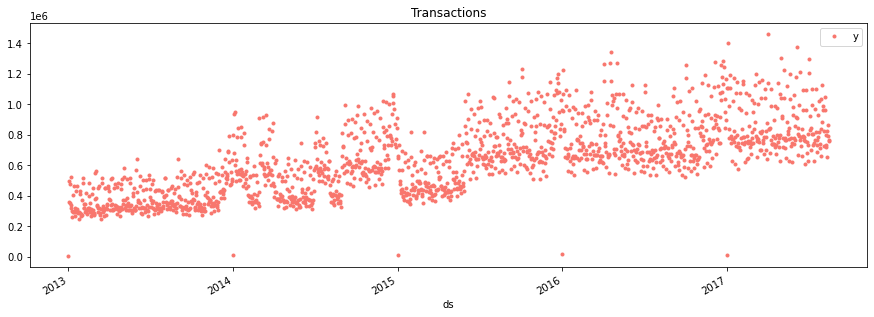

In [83]:
color_pal = ["#F8766D", "#D39200", "#93AA00", "#00BA38", "#00C19F", "#00B9E3", "#619CFF", "#DB72FB"]
_ = trans.plot(style='.', figsize=(15,5), color=color_pal[0], title='Transactions')

In [84]:
split_date = '2016-06-30'
trans_train = trans.loc[trans.index <= split_date].copy()
trans_test = trans.loc[trans.index > split_date].copy()

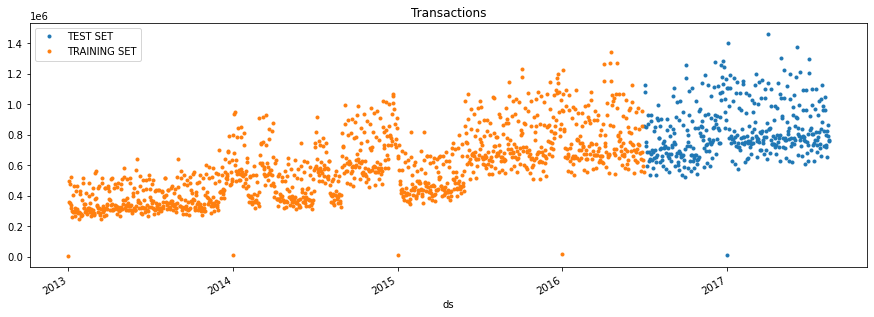

In [85]:
_ = trans_test \
    .rename(columns={'y': 'TEST SET'}) \
    .join(trans_train.rename(columns={'y': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='Transactions', style='.')

In [86]:
def create_features(df, label=None):
    """
    создаем признаки из datetime индекса
    """
    df['date'] = df.index
    #df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    
    X = df[['dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    if label:
        y = df[label]
        return X, y
    return X

In [87]:
X_train, y_train = create_features(trans_train, label='y')
X_test, y_test = create_features(trans_test, label='y')

C:\Users\maxsv\anaconda3\lib\site-packages\ipykernel_launcher.py:13: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.



In [88]:
reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

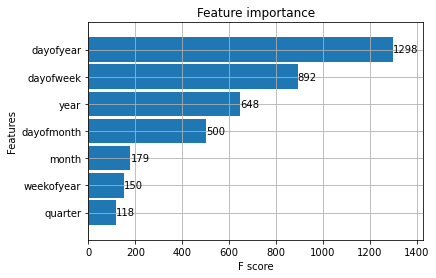

In [89]:
_ = plot_importance(reg, height=0.9)

### Вывод. Продажи наибольшим образом зависят от номера дня в году и от дня недели.

In [90]:
trans_test['Prediction'] = reg.predict(X_test)
trans_all = pd.concat([trans_test, trans_train], sort=False)

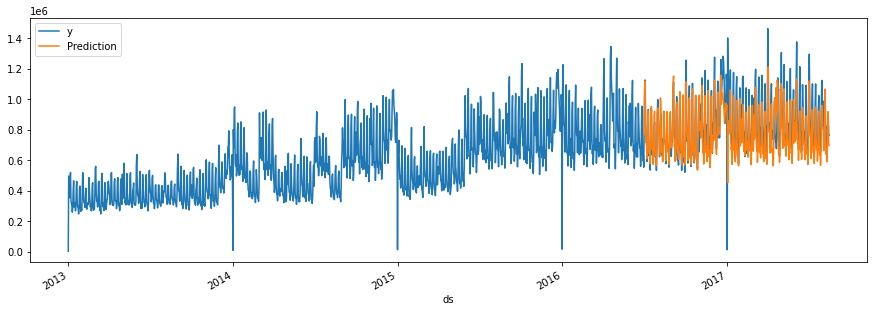

In [91]:
_ = trans_all[['y','Prediction']].plot(figsize=(15, 5))

In [92]:
trans_all

,y,date,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,Prediction
ds,,,,,,,,,,
2016-07-01,857027.554,2016-07-01,4,3,7,2016,183,1,26,7.686936e+05
2016-07-02,1078485.141,2016-07-02,5,3,7,2016,184,2,26,1.065608e+06
2016-07-03,1126713.708,2016-07-03,6,3,7,2016,185,3,26,1.118541e+06
2016-07-04,850891.598,2016-07-04,0,3,7,2016,186,4,27,8.095601e+05
2016-07-05,728011.558,2016-07-05,1,3,7,2016,187,5,27,7.161019e+05
...,...,...,...,...,...,...,...,...,...,...
2016-06-26,954344.667,2016-06-26,6,2,6,2016,178,26,25,NaN
2016-06-27,684735.609,2016-06-27,0,2,6,2016,179,27,26,NaN
2016-06-28,596948.935,2016-06-28,1,2,6,2016,180,28,26,NaN


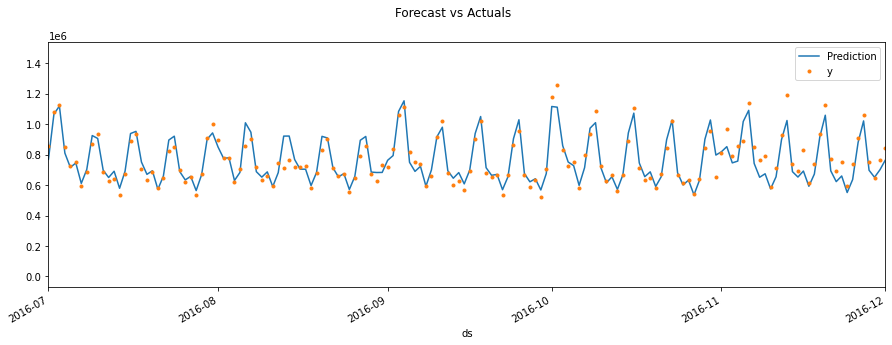

In [93]:
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = trans_all[['Prediction','y']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='07-01-2016', upper='12-01-2016')
#ax.set_ylim(0, 60000)
plot = plt.suptitle('Forecast vs Actuals')

In [94]:
mean_squared_error(y_true=trans_test['y'],
                   y_pred=trans_test['Prediction'])

14057799447.271227

In [95]:
mean_absolute_error(y_true=trans_test['y'],
                   y_pred=trans_test['Prediction'])

82277.6212554878

In [96]:
def mape(y_true, y_pred): 
    """считаем MAPE по y_true и y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [97]:
mape(y_true=trans_test['y'], y_pred=trans_test['Prediction'])

26.607914292710465

## Catboost

In [98]:
cbr = CatBoostRegressor(n_estimators=1000)
cbr.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

In [99]:
trans_test['Prediction_catboost'] = cbr.predict(X_test)
trans_all = pd.concat([trans_test, trans_train], sort=False)

In [100]:
mean_squared_error(y_true=trans_test['y'], y_pred=trans_test['Prediction_catboost'])

25251964244.56508

In [101]:
mean_absolute_error(y_true=trans_test['y'], y_pred=trans_test['Prediction_catboost'])

119064.4484947783

In [102]:
mape(y_true=trans_test['y'], y_pred=trans_test['Prediction_catboost'])

30.46342414430726

### Выводы. XGBoost дал метрики немного лучше, чем CatBoost.

### Добавим данные о праздниках

In [103]:
holidays_list = holidays.ds.values

In [104]:
def get_holiday(date):
    if date in holidays_list:
        return 1
    else: return 0

In [105]:
def create_features(df, label=None):
    """
    создаем признаки из datetime индекса
    """
    df['date'] = df.index
    #df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    df['is_holiday'] = df['date'].apply(get_holiday)
    
    X = df[['dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear','is_holiday']]
    if label:
        y = df[label]
        return X, y
    return X

In [106]:
split_date = '2016-06-30'
trans_train = trans.loc[trans.index <= split_date].copy()
trans_test = trans.loc[trans.index > split_date].copy()

In [107]:
X_train, y_train = create_features(trans_train, label='y')
X_test, y_test = create_features(trans_test, label='y')

C:\Users\maxsv\anaconda3\lib\site-packages\ipykernel_launcher.py:13: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.



In [108]:
reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
        verbose=False)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

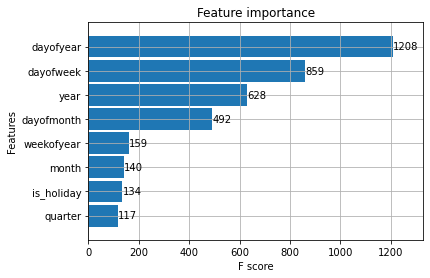

In [109]:
_ = plot_importance(reg, height=0.9)

In [110]:
trans_test['Prediction'] = reg.predict(X_test)
trans_all = pd.concat([trans_test, trans_train], sort=False)

In [111]:
mean_squared_error(y_true=trans_test['y'],
                   y_pred=trans_test['Prediction'])

13870807498.07467

In [112]:
mean_absolute_error(y_true=trans_test['y'],
                   y_pred=trans_test['Prediction'])

80338.92237317073

In [113]:
mape(y_true=trans_test['y'], y_pred=trans_test['Prediction'])

26.714615118166147

### CatBoost with holidays

In [114]:
cbr = CatBoostRegressor(n_estimators=1000)
cbr.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

In [115]:
trans_test['Prediction_catboost'] = cbr.predict(X_test)
trans_all = pd.concat([trans_test, trans_train], sort=False)

In [116]:
mean_squared_error(y_true=trans_test['y'], y_pred=trans_test['Prediction_catboost'])


22813176076.949596

In [117]:
mean_absolute_error(y_true=trans_test['y'], y_pred=trans_test['Prediction_catboost'])

109019.75997399662

In [118]:
mape(y_true=trans_test['y'], y_pred=trans_test['Prediction_catboost'])

31.96043091765292

In [119]:
cbr_features = pd.DataFrame({'feature_importance': cbr.get_feature_importance(), 
              'feature_names': trans_train.columns[2:]}).sort_values(by=['feature_importance'], 
                                                       ascending=False)

<AxesSubplot:ylabel='feature_names'>

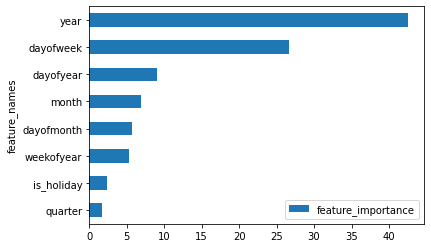

In [120]:
cbr_features.sort_values(by=['feature_importance'], ascending=True).plot.barh(x='feature_names', y='feature_importance')

### Добавление данных о праздниках существенного улучшения метрик не дало

### Добавим Лаги и проверим бустинговые модели

In [121]:
trans_lags = trans.copy()

In [122]:
### Функция генерации признаков и  подготовки тренировочного и тестового датасетов

def prepareData(data, lag_start=5, lag_end=20, test_size=0.15):

    data = pd.DataFrame(data.copy())
    data.columns = ["y"]

    # считаем индекс в датафрейме, после которого начинается тестовыый отрезок
    test_index = int(len(data)*(1-test_size))

    # добавляем лаги исходного ряда в качестве признаков
    for i in range(lag_start, lag_end):
        data["lag_{}".format(i)] = data.y.shift(i)

    #data.index = data.index.to_datetime()
    data['dayofweek'] = data.index.dayofweek
    data['quarter'] = data.index.quarter
    data['month'] = data.index.month
    data['year'] = data.index.year
    data['dayofyear'] = data.index.dayofyear
    data['dayofmonth'] = data.index.day
    data['weekofyear'] = data.index.weekofyear

    data['date'] = data.index
    data['is_holiday'] = data.date.apply(get_holiday)
    data.drop('date', axis=1, inplace=True)

    # разбиваем весь датасет на тренировочную и тестовую выборку
    X_train = data.iloc[:test_index].drop(["y"], axis=1)
    y_train = data.iloc[:test_index]["y"]
    X_test = data.iloc[test_index:].drop(["y"], axis=1)
    y_test = data.iloc[test_index:]["y"]

    return X_train, X_test, y_train, y_test

### Будем брать 14 лагов начиная с 31, таким образом модель будет способна строить предсказания на месяц вперёд

In [123]:
X_train, X_test, y_train, y_test = prepareData(trans_lags, test_size=0.3, lag_start=31, lag_end=45)

C:\Users\maxsv\anaconda3\lib\site-packages\ipykernel_launcher.py:22: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)



### XGBoost

In [124]:
reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
        verbose=False)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

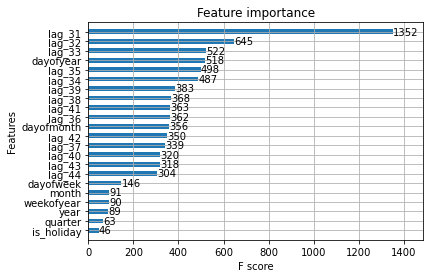

In [125]:
_ = plot_importance(reg, height=0.5)

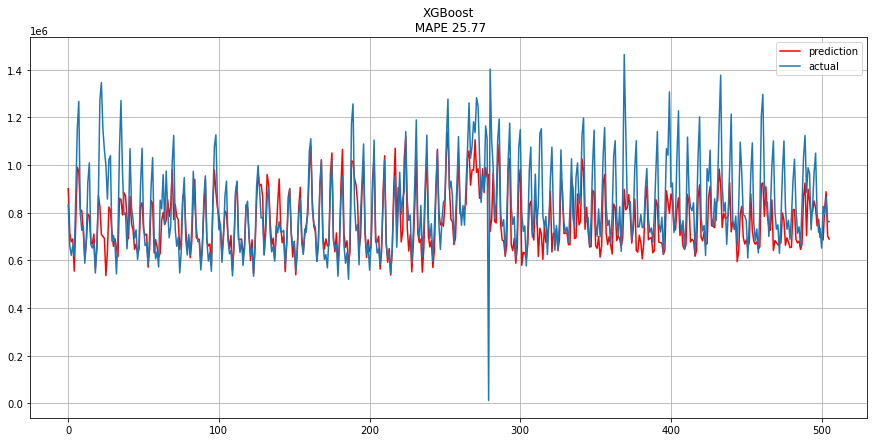

In [126]:
prediction = reg.predict(X_test)
plt.figure(figsize=(15, 7))
plt.plot(prediction, "r", label="prediction")
plt.plot(y_test.values, label="actual")
plt.legend(loc="best")
plt.title("XGBoost\n MAPE {}".format(round(mape(y_test, prediction),2)))
plt.grid(True);

In [127]:
mape(y_true=y_test, y_pred=prediction)

25.77147500977845

### Кросс-валидация

In [128]:
def performTimeSeriesCV(X_train, y_train, model):
    
    number_folds = int(np.floor(float(X_train.shape[0]) / 30))
    
    print('Number of folds: {}'.format(number_folds))
    print('Size train set: {}'.format(X_train.shape))
    k = 30 #int(np.floor(float(X_train.shape[0]) / number_folds))
    
    print('Size of each fold: {}'.format(k))

    errors = np.zeros(number_folds-1)

    # loop from the first 2 folds to the total number of folds    
    for i in range(2, number_folds + 1):
        print('')
        split = float(i-1)/i
        print('Splitting the first ' + str(i) + ' chunks at ' + str(i-1) + '/' + str(i) )

        X = X_train[:(k*i)]
        y = y_train[:(k*i)]
        print('Size of train + test: {}'.format(X.shape)) # the size of the dataframe is going to be k*i

        index = int(np.floor(X.shape[0] * split))

        # folds used to train the model        
        X_trainFolds = X[:index]        
        y_trainFolds = y[:index]

        # fold used to test the model
        X_testFold = X[(index + 1):]
        y_testFold = y[(index + 1):]

        model.fit(X_trainFolds, y_trainFolds)
        errors[i-2] = mape(y_testFold, model.predict(X_testFold))

    # the function returns the mean of the errors on the n-1 folds    
    return errors.mean()

In [129]:
%%time
mape_cv_mean = performTimeSeriesCV(X_train, y_train, reg)

Number of folds: 39
Size train set: (1178, 22)
Size of each fold: 30

Splitting the first 2 chunks at 1/2
Size of train + test: (60, 22)

Splitting the first 3 chunks at 2/3
Size of train + test: (90, 22)

Splitting the first 4 chunks at 3/4
Size of train + test: (120, 22)

Splitting the first 5 chunks at 4/5
Size of train + test: (150, 22)

Splitting the first 6 chunks at 5/6
Size of train + test: (180, 22)

Splitting the first 7 chunks at 6/7
Size of train + test: (210, 22)

Splitting the first 8 chunks at 7/8
Size of train + test: (240, 22)

Splitting the first 9 chunks at 8/9
Size of train + test: (270, 22)

Splitting the first 10 chunks at 9/10
Size of train + test: (300, 22)

Splitting the first 11 chunks at 10/11
Size of train + test: (330, 22)

Splitting the first 12 chunks at 11/12
Size of train + test: (360, 22)

Splitting the first 13 chunks at 12/13
Size of train + test: (390, 22)

Splitting the first 14 chunks at 13/14
Size of train + test: (420, 22)

Splitting the first 1

In [130]:
print('MAPE metrics on CV: {}'.format(mape_cv_mean))

MAPE metrics on CV: 20.619132312708597


### Кросс-валидация XGBoost на тесте дала метрику лучше. Скорее всего это связано с постоянным дообучением модели на каждом фолде.

### CatBoost with holidays & lags

In [131]:
cbr = CatBoostRegressor(n_estimators=1000)
cbr.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
        verbose=False)

<AxesSubplot:ylabel='feature_names'>

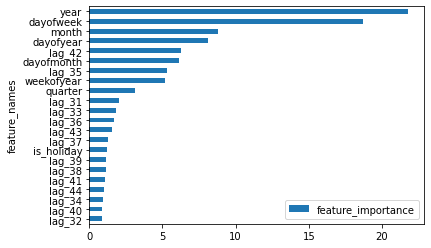

In [132]:
cbr_features = pd.DataFrame({'feature_importance': cbr.get_feature_importance(), 
              'feature_names': X_train.columns}).sort_values(by=['feature_importance'], 
                                                       ascending=False)
cbr_features.sort_values(by=['feature_importance'], ascending=True).plot.barh(x='feature_names', y='feature_importance')

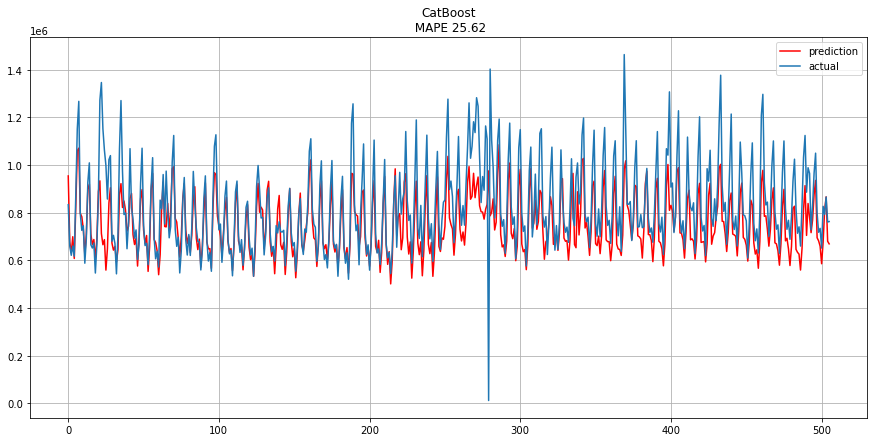

In [133]:
prediction = cbr.predict(X_test)
plt.figure(figsize=(15, 7))
plt.plot(prediction, "r", label="prediction")
plt.plot(y_test.values, label="actual")
plt.legend(loc="best")
plt.title("CatBoost\n MAPE {}".format(round(mape(y_test, prediction),2)))
plt.grid(True);

In [134]:
mape(y_true=y_test, y_pred=prediction)

25.623320297999364

In [135]:
def performTimeSeriesCV_CB(X_train, y_train, model):
    
    number_folds = int(np.floor(float(X_train.shape[0]) / 30))
    
    print('Number of folds: {}'.format(number_folds))
    print('Size train set: {}'.format(X_train.shape))
    k = 30 #int(np.floor(float(X_train.shape[0]) / number_folds))
    
    print('Size of each fold: {}'.format(k))

    errors = np.zeros(number_folds-1)

    # loop from the first 2 folds to the total number of folds    
    for i in range(2, number_folds + 1):
        print('')
        split = float(i-1)/i
        print('Splitting the first ' + str(i) + ' chunks at ' + str(i-1) + '/' + str(i) )

        X = X_train[:(k*i)]
        y = y_train[:(k*i)]
        print('Size of train + test: {}'.format(X.shape)) # the size of the dataframe is going to be k*i

        index = int(np.floor(X.shape[0] * split))

        # folds used to train the model        
        X_trainFolds = X[:index]        
        y_trainFolds = y[:index]

        # fold used to test the model
        X_testFold = X[(index + 1):]
        y_testFold = y[(index + 1):]

        model.fit(X_trainFolds, y_trainFolds,
                  eval_set=[(X_trainFolds, y_trainFolds),
                            (X_testFold, y_testFold)],
                  early_stopping_rounds=50,
                  verbose=False)
       
        errors[i-2] = mape(y_testFold, model.predict(X_testFold))

    # the function returns the mean of the errors on the n-1 folds    
    return errors.mean()

In [136]:
%%time
mape_cv_mean = performTimeSeriesCV_CB(X_train, y_train, cbr)


Number of folds: 39
Size train set: (1178, 22)
Size of each fold: 30

Splitting the first 2 chunks at 1/2
Size of train + test: (60, 22)

Splitting the first 3 chunks at 2/3
Size of train + test: (90, 22)

Splitting the first 4 chunks at 3/4
Size of train + test: (120, 22)

Splitting the first 5 chunks at 4/5
Size of train + test: (150, 22)

Splitting the first 6 chunks at 5/6
Size of train + test: (180, 22)

Splitting the first 7 chunks at 6/7
Size of train + test: (210, 22)

Splitting the first 8 chunks at 7/8
Size of train + test: (240, 22)

Splitting the first 9 chunks at 8/9
Size of train + test: (270, 22)

Splitting the first 10 chunks at 9/10
Size of train + test: (300, 22)

Splitting the first 11 chunks at 10/11
Size of train + test: (330, 22)

Splitting the first 12 chunks at 11/12
Size of train + test: (360, 22)

Splitting the first 13 chunks at 12/13
Size of train + test: (390, 22)

Splitting the first 14 chunks at 13/14
Size of train + test: (420, 22)

Splitting the first 1

In [137]:
print('MAPE metrics on CV: {}'.format(mape_cv_mean))

MAPE metrics on CV: 22.638425855921888


### Кросс-валидация Catboost на тесте также дала метрику лучше. Скорее всего это связано с постоянным дообучением модели на каждом фолде.

## Вывод. Бустинговые модели с добавлением лагов дают хорошее улучшение метрики. В данном случае лучше работает XGBoost. Почему-то признак праздничного дня не в числе значимых для этих моделей.
И обязательно надо держать в уме номерацию лагов и то, как модель будет работать в реальности - на какой срок она будет делать прогноз и какими данными обладать. В тестовой выборке должны быть только лаги с данными из тренировочной выборки. min_lag_number > test_size.